## Section 1

In [1]:
import numpy as np
import torch
torch.set_printoptions(precision=8)

In [2]:

def f_numpy(X):
    return np.sin(X[:,0])*np.cos(X[:,1]) + np.sin(0.5*X[:,0])*np.cos(0.5*X[:,1])

def f_torch(X):
    return torch.sin(X[:,0])*torch.cos(X[:,1]) + torch.sin(0.5*X[:,0])*torch.cos(0.5*X[:,1])

In [3]:
X1=np.array([[1,2],[2,3],[3,4],[4,5]])
X2=torch.tensor([[1,2],[2,3],[3,4],[4,5]],dtype=torch.float32)

In [4]:
result1 = f_numpy(X1)
print(result1)
print("\n")
result2 = f_torch(X2)
print(result2)

[-0.09114076 -0.84067433 -0.50734658 -0.94315408]


tensor([-0.09114072, -0.84067434, -0.50734657, -0.94315404])


## Section 2

In [5]:
def gradient_numpy(X):
    X = X.astype(np.float32)
    grad = np.zeros_like(X)
    grad[:,0] = np.cos(X[:,0])*np.cos(X[:,1]) + 0.5*np.cos(0.5*X[:,0])*np.cos(0.5*X[:,1])
    grad[:,1] = -np.sin(X[:,0])*np.sin(X[:,1]) - 0.5*np.sin(0.5*X[:,0])*np.sin(0.5*X[:,1])

    return grad

def gradient_torch(X):
    grad = torch.zeros_like(X)
    grad[:,0] = torch.cos(X[:,0])*torch.cos(X[:,1]) + 0.5*torch.cos(0.5*X[:,0])*torch.cos(0.5*X[:,1])
    grad[:,1] = -torch.sin(X[:,0])*torch.sin(X[:,1]) - 0.5*torch.sin(0.5*X[:,0])*torch.sin(0.5*X[:,1])

    return grad

In [6]:
print("X1:", X1)
print("X2:", X2)
result11 = gradient_numpy(X1)
print(result11)
print("\n")
result22 = gradient_torch(X2)
print(result22)

X1: [[1 2]
 [2 3]
 [3 4]
 [4 5]]
X2: tensor([[1., 2.],
        [2., 3.],
        [3., 4.],
        [4., 5.]])
[[ 0.01223485 -0.96685874]
 [ 0.43109196 -0.5480016 ]
 [ 0.63238376 -0.34670985]
 [-0.01871729 -0.9978109 ]]


tensor([[ 0.01223484, -0.96685874],
        [ 0.43109199, -0.54800159],
        [ 0.63238376, -0.34670985],
        [-0.01871730, -0.99781084]])


In [7]:
np.allclose(result22, result11)

True

## Section 3

In [8]:
from torch import vmap
def grad_desc_numpy(X_init, learning_rate=0.01, iterations=100):
    path = [X_init.copy()]
    X = X_init.copy()

    for i in range (iterations):
        grad = gradient_numpy(X.reshape(1, 2)).reshape(2)
        X = X - learning_rate * grad 
        path.append(X.copy())

    return np.array(path)


def gradient_descent_single_step(x, learning_rate):

    grad = gradient_torch(x.reshape(1, 2)).reshape(2)
    return x - learning_rate * grad

def grad_desc_pytorch(X_init, learning_rate=0.01, iterations=100):

    n_init = X_init.shape[0]
    paths = torch.zeros(n_init, iterations + 1, 2)
    paths[:, 0, :] = X_init
    X_current = X_init.clone()

    for i in range(iterations):
        X_current = vmap(lambda x: gradient_descent_single_step(x, learning_rate))(X_current)
        paths[:, i + 1, :] = X_current
    
    return paths

In [9]:
import matplotlib.pyplot as plt

def visualize_gradient_descent(paths, f_fn, title="Gradient Descent Paths"):

    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Create contour plot
    x_range = np.linspace(-10, 10, 200)
    y_range = np.linspace(-10, 10, 200)
    X_grid, Y_grid = np.meshgrid(x_range, y_range)
    
    # Evaluate function on grid
    grid_points = np.stack([X_grid.ravel(), Y_grid.ravel()], axis=1)
    Z = f_fn(grid_points).reshape(X_grid.shape)
    
    # Plot contours
    contour = ax.contour(X_grid, Y_grid, Z, levels=30, cmap='viridis', alpha=0.6)
    ax.contourf(X_grid, Y_grid, Z, levels=30, cmap='viridis', alpha=0.3)
    plt.colorbar(contour, ax=ax, label='f(x)')
    
    # Plot paths
    if isinstance(paths, list):
        # List of individual paths
        for path in paths:
            if isinstance(path, torch.Tensor):
                path = path.detach().cpu().numpy()
            ax.plot(path[:, 0], path[:, 1], 'r.-', alpha=0.6, linewidth=1.5, markersize=3)
            ax.plot(path[0, 0], path[0, 1], 'go', markersize=10, label='Start')
            ax.plot(path[-1, 0], path[-1, 1], 'r*', markersize=15, label='End')
    else:
        # Array of shape (n_paths, n_iter, 2)
        if isinstance(paths, torch.Tensor):
            paths = paths.detach().cpu().numpy()
        
        for i in range(paths.shape[0]):
            path = paths[i]
            ax.plot(path[:, 0], path[:, 1], '.-', alpha=0.6, linewidth=1.5, markersize=3)
            ax.plot(path[0, 0], path[0, 1], 'go', markersize=8)
            ax.plot(path[-1, 0], path[-1, 1], 'r*', markersize=12)
    
    ax.set_xlabel('x₀')
    ax.set_ylabel('x₁')
    ax.set_title(title)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


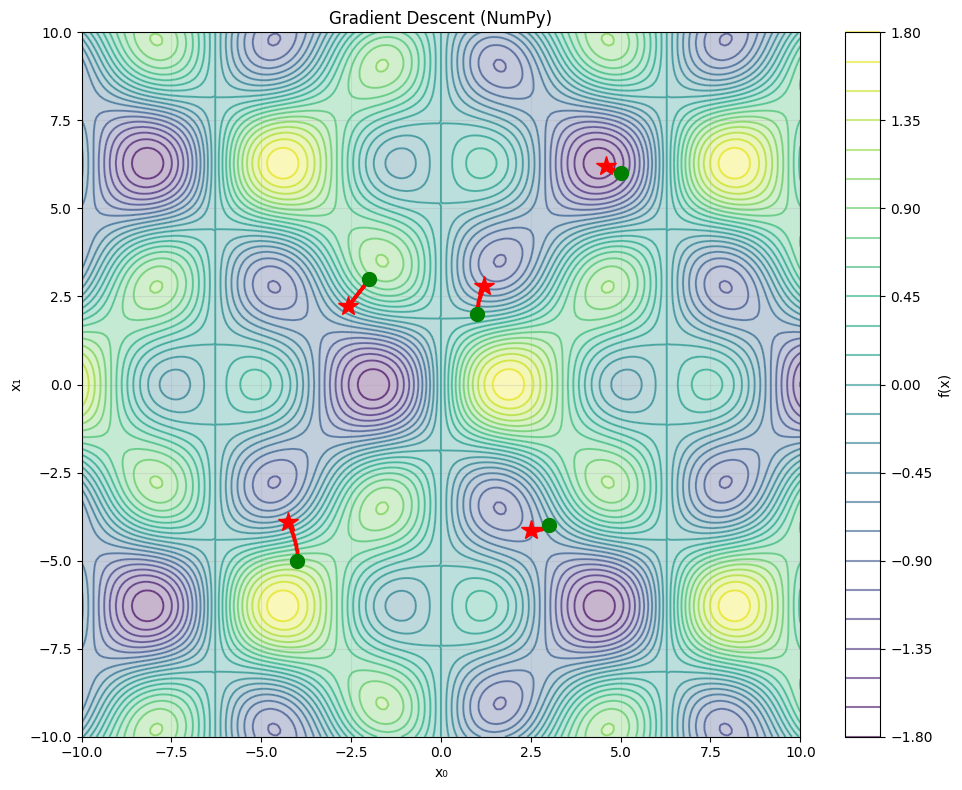

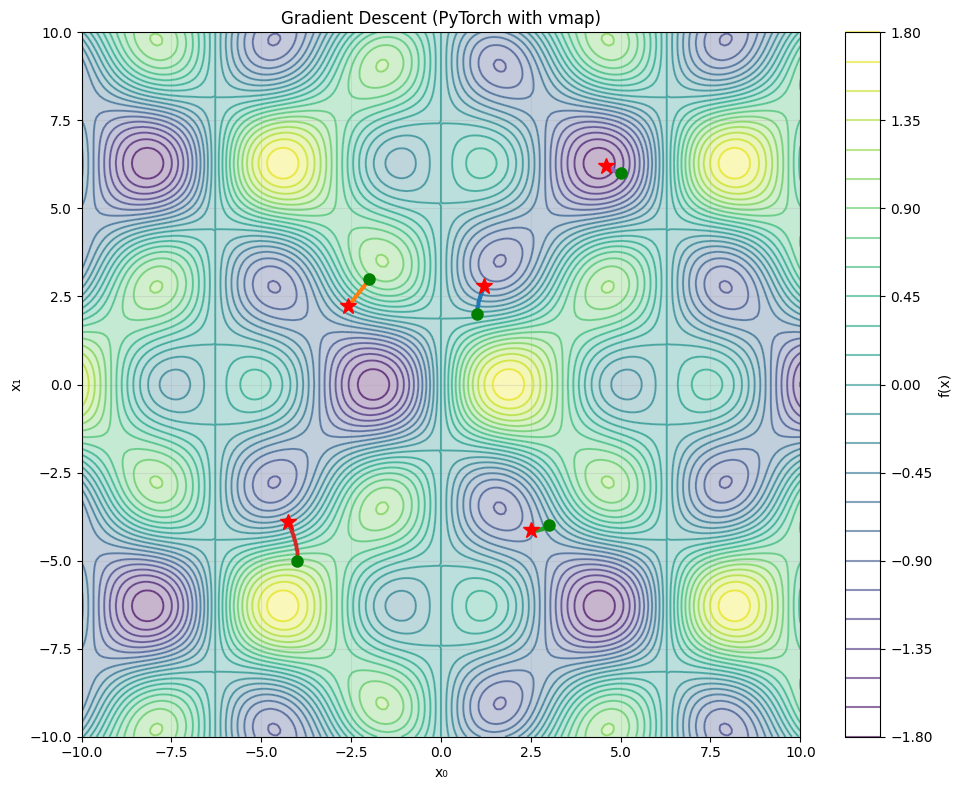

In [10]:
 starting_points_np = np.array([
        [1.0, 2.0],
        [-2.0, 3.0],
        [3.0, -4.0],
        [-4.0, -5.0],
        [5.0, 6.0]
    ])


starting_points_torch = torch.tensor(starting_points_np, dtype=torch.float32)
    
paths_numpy = []
for start in starting_points_np:
    path = grad_desc_numpy(start)
    paths_numpy.append(path)


visualize_gradient_descent(paths_numpy, f_numpy, title="Gradient Descent (NumPy)")

paths_torch = grad_desc_pytorch(starting_points_torch)

visualize_gradient_descent(paths_torch, f_numpy, title="Gradient Descent (PyTorch with vmap)")

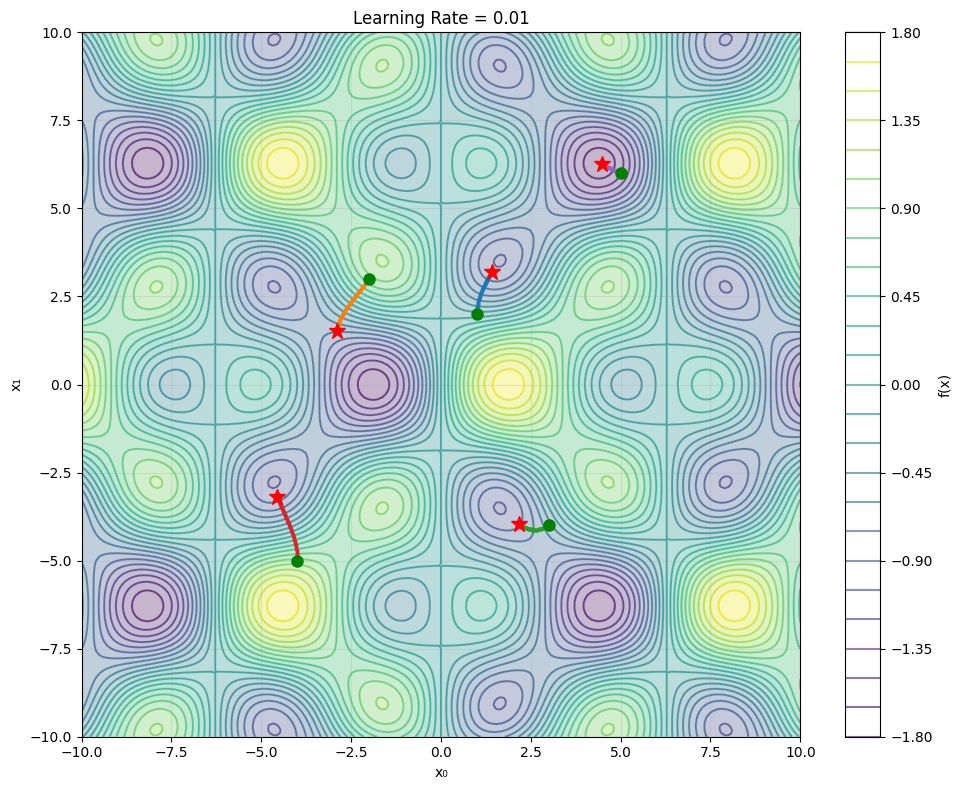

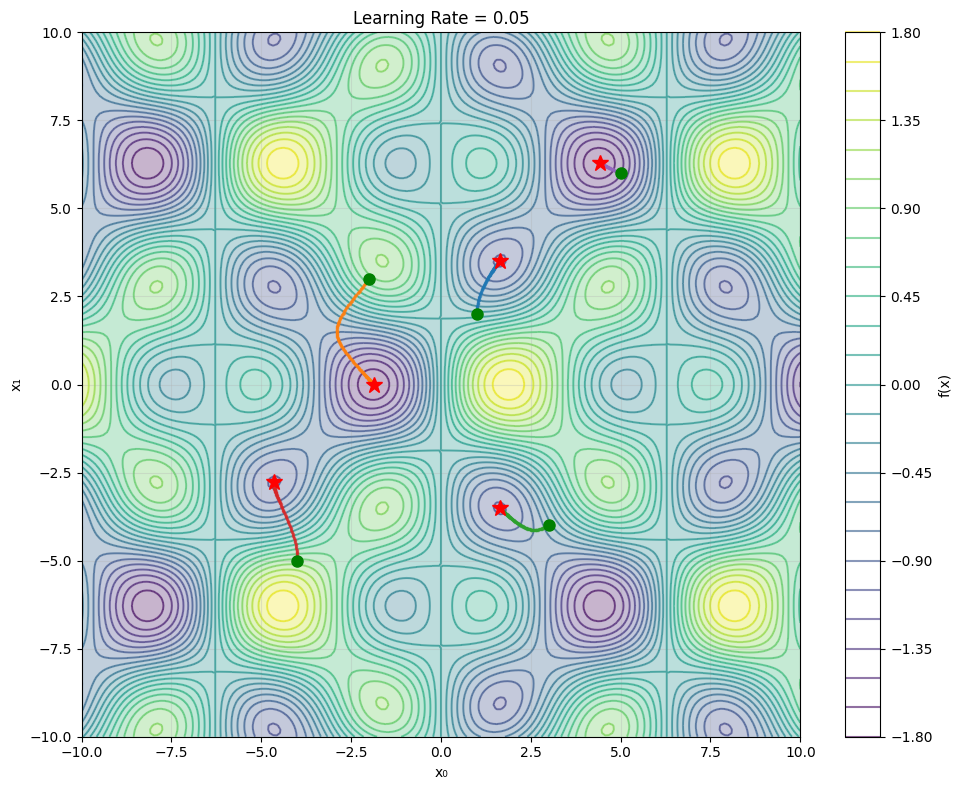

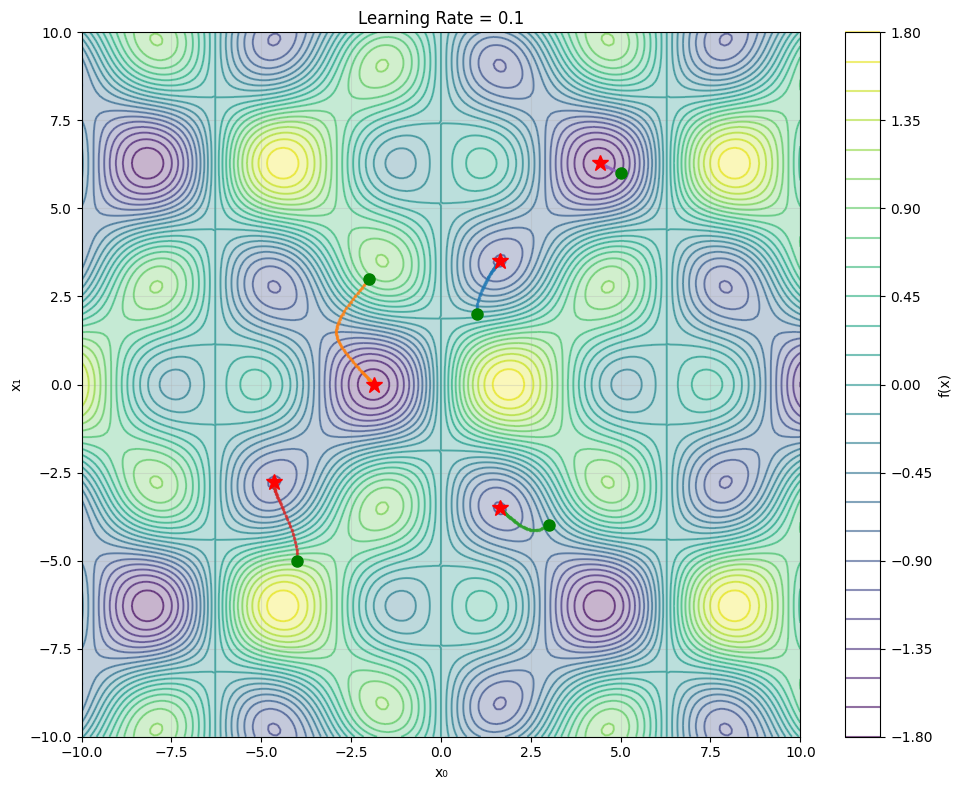

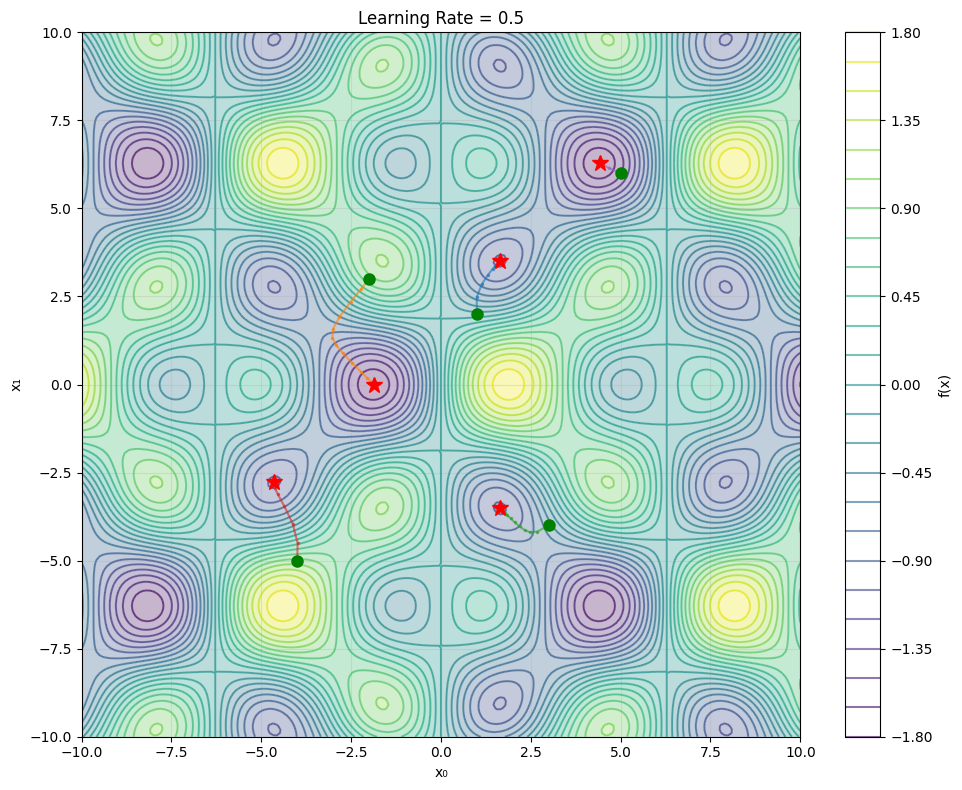

In [11]:
# 1. Try different learning rates
learning_rates = [0.01, 0.05, 0.1, 0.5]
for lr in learning_rates:
    paths = grad_desc_pytorch(starting_points_torch, 
                                         learning_rate=lr, iterations=200)
    visualize_gradient_descent(paths, f_numpy, title=f"Learning Rate = {lr}")



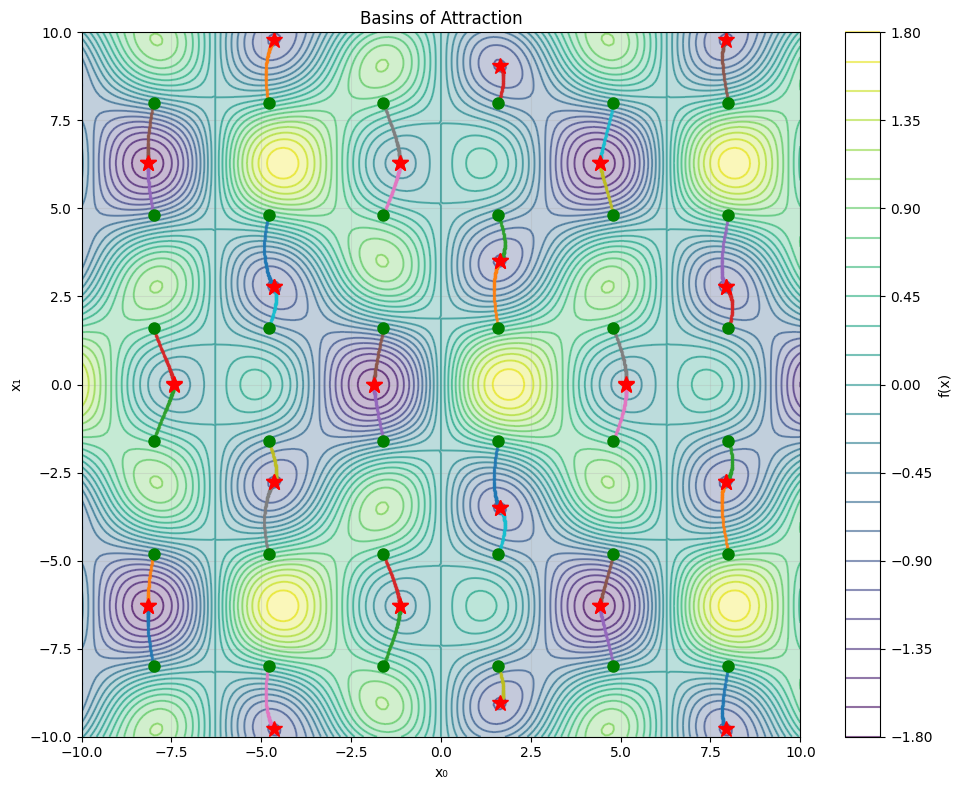

In [12]:
# 2. Start from a grid of points to see the "basin of attraction" for each minimum
x_starts = []
for x in np.linspace(-8, 8, 6):
    for y in np.linspace(-8, 8, 6):
        x_starts.append([x, y])
starting_grid = torch.tensor(x_starts, dtype=torch.float32)

paths = grad_desc_pytorch(starting_grid, 
                                     learning_rate=0.05, iterations=150)
visualize_gradient_descent(paths, f_numpy, title="Basins of Attraction")



## Section 4

In [13]:
def grad_desc_momentum_numpy(X_init, learning_rate=0.01, iterations=100, momentum=0.3):
    """Gradient descent with momentum - NumPy version"""
    path = [X_init.copy()]
    X = X_init.copy()
    velocity = np.zeros_like(X)  # Must track velocity!
    grad_norms = []
    
    # Initial gradient norm
    grad = gradient_numpy(X.reshape(1, 2)).reshape(2)
    grad_norms.append(np.linalg.norm(grad))
    
    for i in range(iterations):
        grad = gradient_numpy(X.reshape(1, 2)).reshape(2)
        
        # Correct momentum: update velocity, then position
        velocity = momentum * velocity - learning_rate * grad
        X = X + velocity
        
        path.append(X.copy())
        grad_norms.append(np.linalg.norm(grad))
    
    return np.array(path), np.array(grad_norms)


def gradient_descent_momentum_single_step(x, velocity, learning_rate, momentum=0.3):
    """Single step with momentum - PyTorch version"""
    grad = gradient_torch(x.reshape(1, 2)).reshape(2)
    grad_norm = torch.norm(grad)
    
    # Correct momentum update
    velocity_new = momentum * velocity - learning_rate * grad
    x_new = x + velocity_new
    
    return x_new, velocity_new, grad_norm


def grad_desc_momentum_pytorch(X_init, learning_rate=0.01, momentum=0.3, iterations=100):
    """Gradient descent with momentum - PyTorch vmap version"""
    n_init = X_init.shape[0]
    paths = torch.zeros(n_init, iterations + 1, 2)
    grad_norms = torch.zeros(n_init, iterations + 1)
    
    paths[:, 0, :] = X_init
    X_current = X_init.clone()
    velocities = torch.zeros_like(X_init)
    
    # Initial gradient norms
    for i in range(n_init):
        grad = gradient_torch(X_current[i].reshape(1, 2)).reshape(2)
        grad_norms[i, 0] = torch.norm(grad)
    
    # Main optimization loop
    for i in range(iterations):
        X_current, velocities, gnorms = vmap(
            lambda x, v: gradient_descent_momentum_single_step(x, v, learning_rate, momentum)
        )(X_current, velocities)
        
        paths[:, i + 1, :] = X_current
        grad_norms[:, i + 1] = gnorms
    
    return paths, grad_norms

In [14]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from torch.func import vmap

def visualize_with_gradient_norms(paths, grad_norms, f_fn, title="Gradient Descent with Momentum"):
    """
    Visualize both the paths and gradient norm convergence
    Args:
        paths: tensor/array of shape (n_paths, n_iter+1, 2) OR list of arrays
        grad_norms: tensor/array of shape (n_paths, n_iter+1) OR list of arrays
        f_fn: function for contour plot
        title: plot title
    """
    fig = plt.figure(figsize=(16, 6))
    
    # Convert to numpy if needed
    if isinstance(paths, torch.Tensor):
        paths = paths.detach().cpu().numpy()
    if isinstance(grad_norms, torch.Tensor):
        grad_norms = grad_norms.detach().cpu().numpy()
    
    # Handle list format (from NumPy version)
    if isinstance(paths, list):
        n_paths = len(paths)
        max_path_len = max(p.shape[0] for p in paths)
        max_grad_len = max(len(g) for g in grad_norms)
        max_len = max(max_path_len, max_grad_len)
        
        paths_array = np.zeros((n_paths, max_len, 2))
        grad_norms_array = np.zeros((n_paths, max_len))
        
        for i in range(n_paths):
            path_len = paths[i].shape[0]
            grad_len = len(grad_norms[i])
            
            paths_array[i, :path_len, :] = paths[i]
            grad_norms_array[i, :grad_len] = grad_norms[i]
            
            # Fill remaining with NaN
            if path_len < max_len:
                paths_array[i, path_len:, :] = np.nan
            if grad_len < max_len:
                grad_norms_array[i, grad_len:] = np.nan
        
        paths = paths_array
        grad_norms = grad_norms_array
    
    # Left plot: Optimization paths
    ax1 = plt.subplot(1, 2, 1)
    
    # Create contour plot
    x_range = np.linspace(-10, 10, 200)
    y_range = np.linspace(-10, 10, 200)
    X_grid, Y_grid = np.meshgrid(x_range, y_range)
    grid_points = np.stack([X_grid.ravel(), Y_grid.ravel()], axis=1)
    Z = f_fn(grid_points).reshape(X_grid.shape)
    
    contour = ax1.contour(X_grid, Y_grid, Z, levels=30, cmap='viridis', alpha=0.6)
    ax1.contourf(X_grid, Y_grid, Z, levels=30, cmap='viridis', alpha=0.3)
    
    # Plot paths
    colors = plt.cm.rainbow(np.linspace(0, 1, paths.shape[0]))
    for i in range(paths.shape[0]):
        path = paths[i]
        # Filter out NaN values
        valid_mask = ~np.isnan(path[:, 0])
        valid_path = path[valid_mask]
        
        ax1.plot(valid_path[:, 0], valid_path[:, 1], '.-', color=colors[i], alpha=0.7, 
                linewidth=1.5, markersize=3, label=f'Start {i+1}')
        ax1.plot(valid_path[0, 0], valid_path[0, 1], 'o', color=colors[i], markersize=10)
        ax1.plot(valid_path[-1, 0], valid_path[-1, 1], '*', color=colors[i], markersize=15)
    
    ax1.set_xlabel('x₀', fontsize=12)
    ax1.set_ylabel('x₁', fontsize=12)
    ax1.set_title('Optimization Paths', fontsize=14)
    ax1.grid(True, alpha=0.3)
    ax1.legend(fontsize=9, loc='best')
    
    # Right plot: Gradient norms over time
    ax2 = plt.subplot(1, 2, 2)
    
    for i in range(grad_norms.shape[0]):
        gnorms = grad_norms[i]
        # Filter out NaN and zero values
        valid_mask = ~np.isnan(gnorms) & (gnorms > 0)
        valid_gnorms = gnorms[valid_mask]
        valid_indices = np.where(valid_mask)[0]
        
        if len(valid_gnorms) > 0:
            ax2.plot(valid_indices, valid_gnorms, color=colors[i], alpha=0.7, 
                    linewidth=2, label=f'Start {i+1}')
    
    ax2.set_xlabel('Iteration', fontsize=12)
    ax2.set_ylabel('||∇f(x)||₂ (Gradient Norm)', fontsize=12)
    ax2.set_title('Gradient Norm Convergence to Zero', fontsize=14)
    ax2.set_yscale('log')  # Log scale to see convergence better
    ax2.grid(True, alpha=0.3, which='both')
    ax2.legend(fontsize=9, loc='best')
    
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()


def visualize_gradient_descent_simple(paths, f_fn, title="Gradient Descent Paths"):
    """
    Simple visualization of just the paths (no gradient norms)
    """
    # Handle tuple input (unpack if needed)
    if isinstance(paths, tuple):
        paths = paths[0]
    
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Create contour plot
    x_range = np.linspace(-10, 10, 200)
    y_range = np.linspace(-10, 10, 200)
    X_grid, Y_grid = np.meshgrid(x_range, y_range)
    grid_points = np.stack([X_grid.ravel(), Y_grid.ravel()], axis=1)
    Z = f_fn(grid_points).reshape(X_grid.shape)
    
    contour = ax.contour(X_grid, Y_grid, Z, levels=30, cmap='viridis', alpha=0.6)
    ax.contourf(X_grid, Y_grid, Z, levels=30, cmap='viridis', alpha=0.3)
    plt.colorbar(contour, ax=ax, label='f(x)')
    
    # Convert tensor to numpy if needed
    if isinstance(paths, torch.Tensor):
        paths = paths.detach().cpu().numpy()
    
    # Plot paths
    if isinstance(paths, list):
        colors = plt.cm.rainbow(np.linspace(0, 1, len(paths)))
        for idx, path in enumerate(paths):
            if isinstance(path, torch.Tensor):
                path = path.detach().cpu().numpy()
            ax.plot(path[:, 0], path[:, 1], '.-', color=colors[idx], alpha=0.6, 
                   linewidth=1.5, markersize=3)
            ax.plot(path[0, 0], path[0, 1], 'o', color=colors[idx], markersize=10)
            ax.plot(path[-1, 0], path[-1, 1], '*', color=colors[idx], markersize=15)
    else:
        colors = plt.cm.rainbow(np.linspace(0, 1, paths.shape[0]))
        for i in range(paths.shape[0]):
            path = paths[i]
            ax.plot(path[:, 0], path[:, 1], '.-', color=colors[i], alpha=0.6, 
                   linewidth=1.5, markersize=3)
            ax.plot(path[0, 0], path[0, 1], 'o', color=colors[i], markersize=10)
            ax.plot(path[-1, 0], path[-1, 1], '*', color=colors[i], markersize=15)
    
    ax.set_xlabel('x₀')
    ax.set_ylabel('x₁')
    ax.set_title(title)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

Running NumPy gradient descent with momentum...


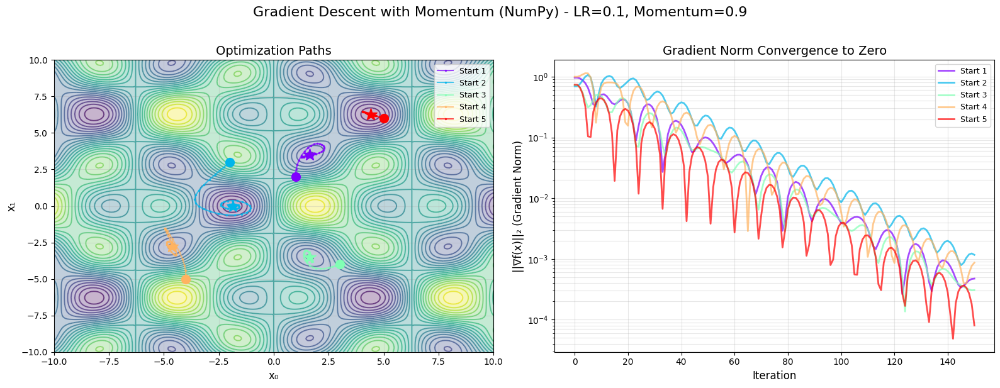

Running PyTorch gradient descent with momentum (vmap)...


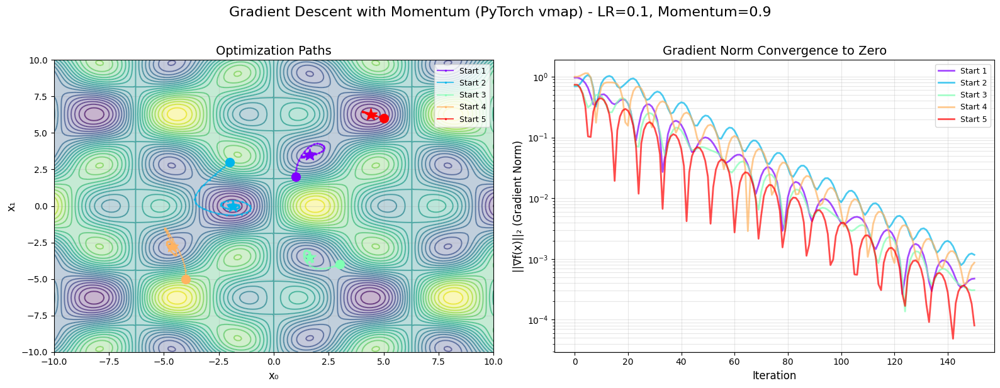


Comparing different momentum values...
Testing momentum = 0.0


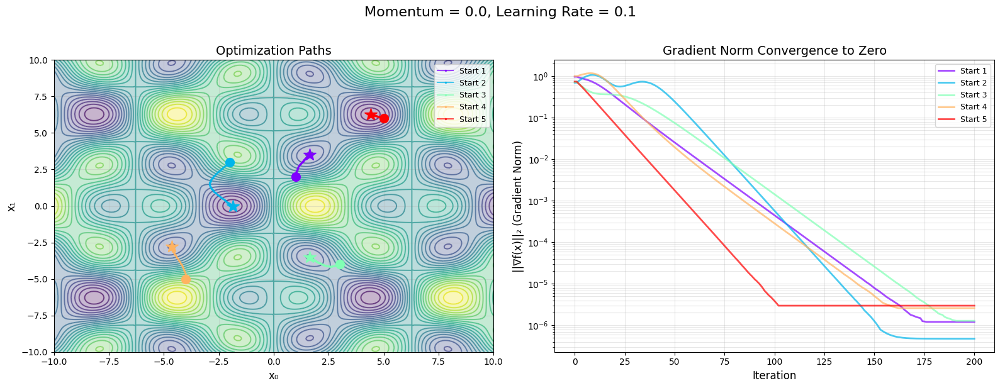

Testing momentum = 0.5


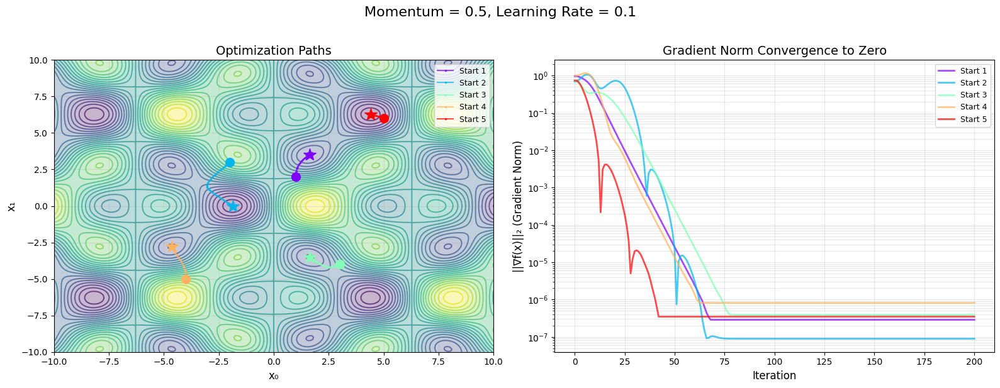

Testing momentum = 0.9


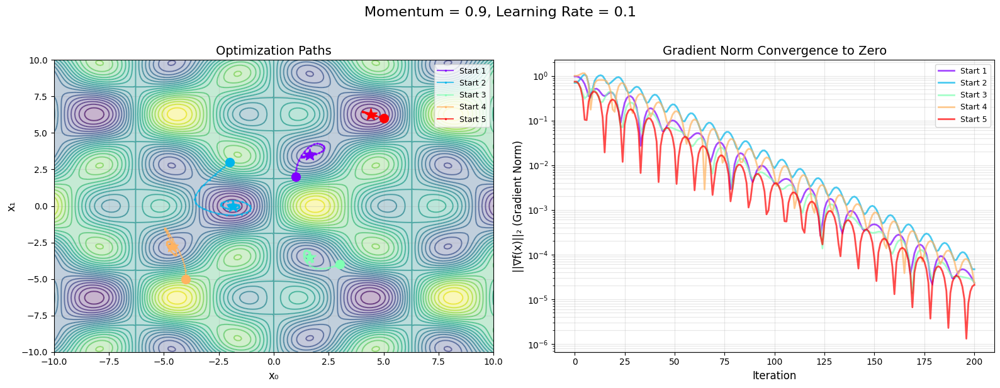

Testing momentum = 0.99


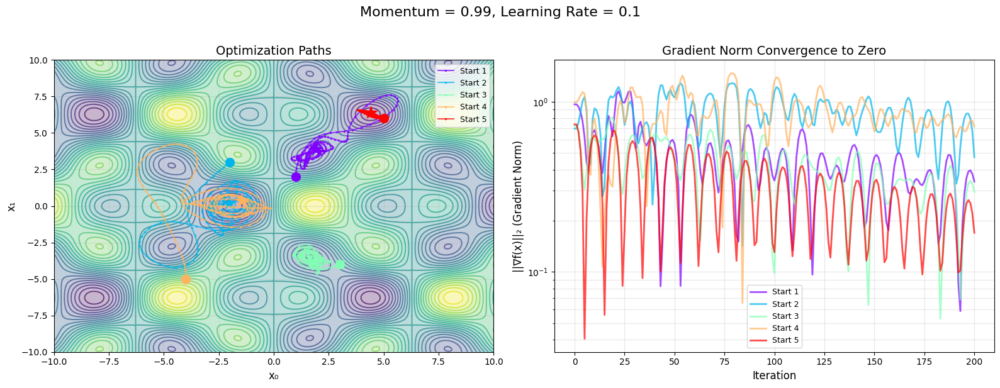


Comparing different learning rates with fixed momentum...
Testing learning rate = 0.01


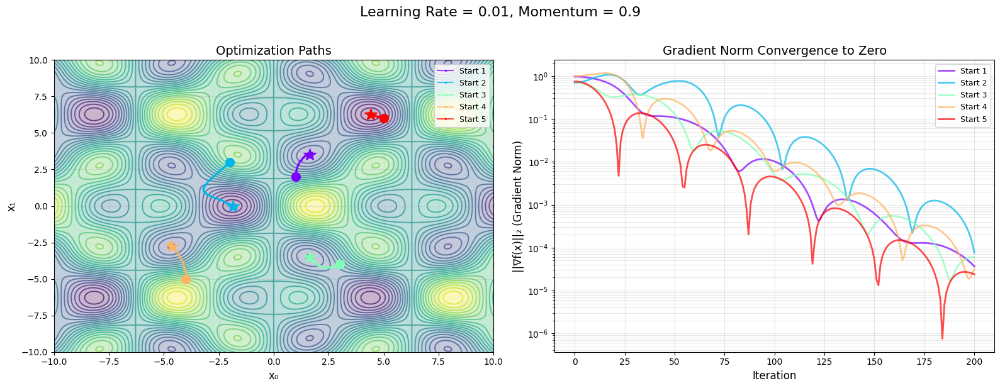

Testing learning rate = 0.05


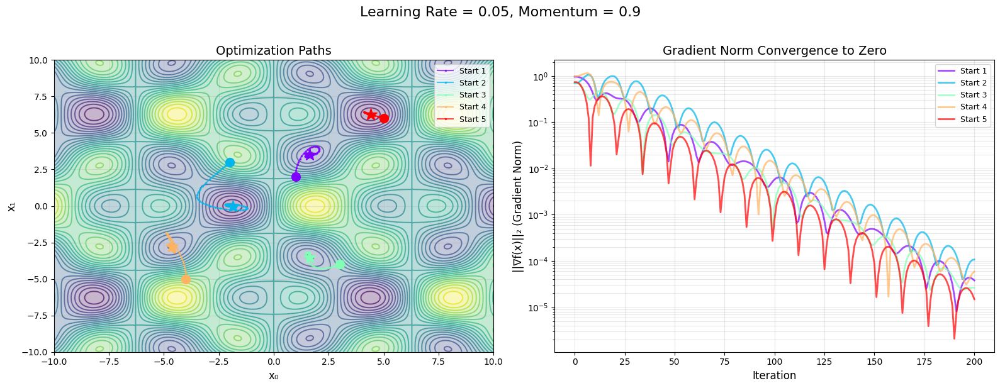

Testing learning rate = 0.1


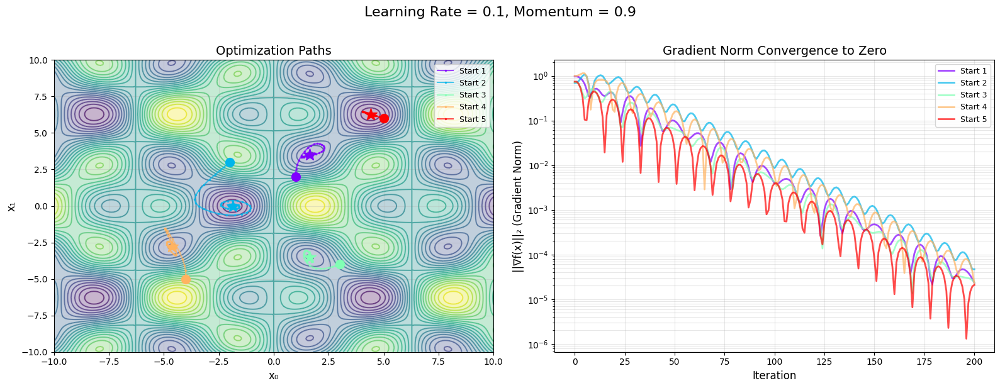

Testing learning rate = 0.3


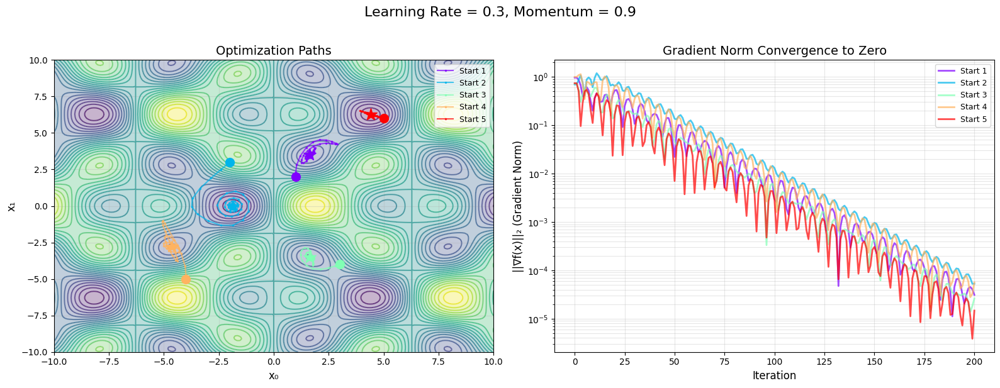


Simple path visualization...


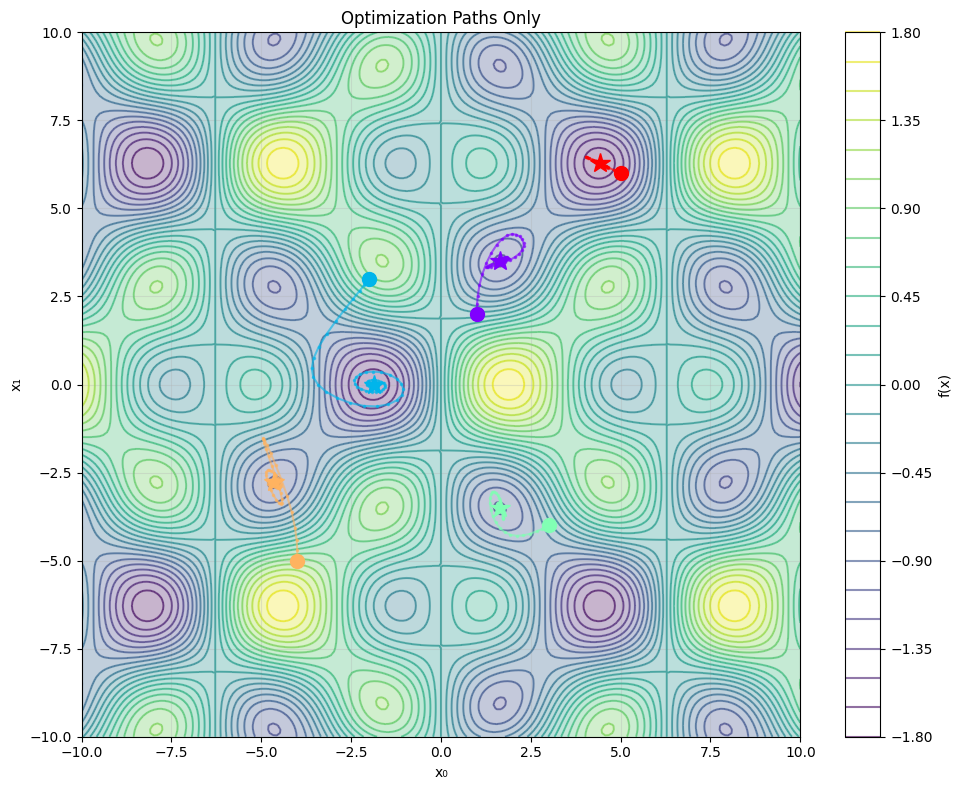

In [15]:
# === Define your starting points ===
starting_points_np = np.array([
    [1.0, 2.0],
    [-2.0, 3.0],
    [3.0, -4.0],
    [-4.0, -5.0],
    [5.0, 6.0]
])
starting_points_torch = torch.tensor(starting_points_np, dtype=torch.float32)

# =====================================================
# Example 1: NumPy Implementation
# =====================================================
print("Running NumPy gradient descent with momentum...")

paths_numpy = []
grad_norms_numpy = []

for start in starting_points_np:
    path, grad_norm = grad_desc_momentum_numpy(
        start, 
        learning_rate=0.1, 
        momentum=0.9, 
        iterations=150
    )
    paths_numpy.append(path)
    grad_norms_numpy.append(grad_norm)

# Visualize with gradient norms
visualize_with_gradient_norms(
    paths_numpy, 
    grad_norms_numpy, 
    f_numpy, 
    title="Gradient Descent with Momentum (NumPy) - LR=0.1, Momentum=0.9"
)

# =====================================================
# Example 2: PyTorch Implementation with vmap
# =====================================================
print("Running PyTorch gradient descent with momentum (vmap)...")

paths_torch, grad_norms_torch = grad_desc_momentum_pytorch(
    starting_points_torch, 
    learning_rate=0.1, 
    momentum=0.9, 
    iterations=150
)

# Visualize with gradient norms
visualize_with_gradient_norms(
    paths_torch, 
    grad_norms_torch, 
    f_numpy,
    title="Gradient Descent with Momentum (PyTorch vmap) - LR=0.1, Momentum=0.9"
)

# =====================================================
# Example 3: Compare Different Momentum Values
# =====================================================
print("\nComparing different momentum values...")

momentum_values = [0.0, 0.5, 0.9, 0.99]

for mom in momentum_values:
    print(f"Testing momentum = {mom}")
    
    # PyTorch version
    paths, grad_norms = grad_desc_momentum_pytorch(
        starting_points_torch,
        learning_rate=0.1,
        momentum=mom,
        iterations=200
    )
    
    visualize_with_gradient_norms(
        paths, 
        grad_norms, 
        f_numpy,
        title=f"Momentum = {mom}, Learning Rate = 0.1"
    )

# =====================================================
# Example 4: Compare Different Learning Rates
# =====================================================
print("\nComparing different learning rates with fixed momentum...")

learning_rates = [0.01, 0.05, 0.1, 0.3]

for lr in learning_rates:
    print(f"Testing learning rate = {lr}")
    
    paths, grad_norms = grad_desc_momentum_pytorch(
        starting_points_torch,
        learning_rate=lr,
        momentum=0.9,
        iterations=200
    )
    
    visualize_with_gradient_norms(
        paths, 
        grad_norms, 
        f_numpy,
        title=f"Learning Rate = {lr}, Momentum = 0.9"
    )

# =====================================================
# Example 5: Simple Path Visualization (no gradient norms)
# =====================================================
print("\nSimple path visualization...")

paths_simple, _ = grad_desc_momentum_pytorch(
    starting_points_torch,
    learning_rate=0.1,
    momentum=0.9,
    iterations=150
)

visualize_gradient_descent_simple(
    paths_simple, 
    f_numpy, 
    title="Optimization Paths Only"
)